In [1]:
import os
n_jobs = 64
os.environ["OMP_NUM_THREADS"] = str(n_jobs)
import joblib
import click
import json
import time

import itertools
import collections.abc
import sys
from tqdm.notebook import tqdm
# !{sys.executable} -m pip install qcircuit

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pennylane as qml
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Qiskit
from qiskit import QuantumCircuit
from qiskit.quantum_info import Pauli, SparsePauliOp, Operator
from qiskit.primitives import StatevectorEstimator
from qiskit.circuit import Parameter, ParameterVector
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.quantum_info import SparsePauliOp
from qiskit_ibm_runtime import EstimatorV2 as Estimator
from qiskit_ibm_runtime import QiskitRuntimeService
from qiskit_aer import AerSimulator
from qiskit_aer.noise import NoiseModel
from qiskit_ibm_runtime.fake_provider import FakeQuebec
from qiskit_ibm_runtime import Batch
from qiskit_ibm_runtime import exceptions
# from qiskit_machine_learning.optimizers import SPSA, Minimizer


from joblib import dump, load
from QiskitRegressor import QiskitRegressor

In [2]:
from qiskit_aer.primitives import EstimatorV2

In [3]:
def mitarai(quantumcircuit,num_wires,paramname='x'):
    # encoding as proposed by Mitarai et al.
    num_features = num_wires
    features = ParameterVector(paramname,num_features*2)
    for i in range(num_wires):
        feature_idx = i % num_features  # Calculate the feature index using modulo
        quantumcircuit.ry(np.arcsin(features[feature_idx * 2]), i)
        quantumcircuit.rz(np.arccos(features[feature_idx * 2 + 1] ** 2), i)


def double_angle(quantumcircuit, num_wires,paramname='x'):
    #  creates a circuit that encodes features into wires via angle encoding with an RY then RZ gate
    #  the features are encoded 1-1 onto the qubits
    #  if more wires are passed then features the remaining wires will be filled from the beginning of the feature list
    num_features = num_wires
    features = ParameterVector(paramname,num_features*2)
    for i in range(num_wires):
        feature_index = i % num_features
        quantumcircuit.ry(features[feature_index], i)
        quantumcircuit.rz(features[feature_index], i)

def entangle_cnot(quantumcircuit,num_wires):
    #  entangles all of the wires in a circular fashion using cnot gates
    for i in range(num_wires):
        
        if i == num_wires - 1:
            quantumcircuit.cx(i, 0)
        else:
            quantumcircuit.cx(i, i+1)


def entangle_cz(quantumcircuit,num_wires):
    #  entangles all of the wires in a circular fashion using cz gates
    for i in range(num_wires):
        
        if i == num_wires - 1:
            quantumcircuit.cz(i, 0)
        else:
            quantumcircuit.cz(i, i+1)


def HardwareEfficient(quantumcircuit,num_wires,paramname='theta'):
    parameters = ParameterVector(paramname,num_wires*3)
    for qubit in range(num_wires):
        quantumcircuit.rx(parameters[qubit * 3], qubit)  
        quantumcircuit.rz(parameters[qubit * 3 + 1], qubit)  
        quantumcircuit.rx(parameters[qubit * 3 + 2], qubit)  
    entangle_cnot(quantumcircuit,num_wires)



In [4]:
# def circuit(nqubits):
#     qc = QuantumCircuit(nqubits)
#     mitarai(qc,nqubits)
#     entangle_cz(qc,nqubits)
#     qc.barrier()
#     mitarai(qc,nqubits,paramname='x1')
#     entangle_cz(qc,nqubits)
#     qc.barrier()
#     HardwareEfficient(qc,nqubits)
#     qc.barrier()
#     return qc


def circuit(nqubits,RUD=1,AL=1):
    qc = QuantumCircuit(nqubits)
    for i in range(RUD):
        double_angle(qc,nqubits,paramname=f'x{i}')
        qc.barrier()
        for j in range(AL):        
            HardwareEfficient(qc,nqubits,paramname=f'theta{i}_{j}')
            qc.barrier()
    return qc

In [5]:

top=os.getcwd()
with open(os.path.join(top,'0.1_5_DDCC_train.bin'),'rb') as f:
    ddcc_train = joblib.load(f)

with open(os.path.join(top,'0.1_5_DDCC_test.bin'),'rb') as f:
    ddcc_test = joblib.load(f)

with open(os.path.join(top,'0.1_5_DDCC_scaler.bin'),'rb') as f:
    ddcc_scaler = joblib.load(f)

X_ddcc_train, y_ddcc_train = ddcc_train['X'],ddcc_train['y']
X_ddcc_test, y_ddcc_test = ddcc_test['X'],ddcc_test['y']

X_ddcc_train = np.hstack([X_ddcc_train,X_ddcc_train]).reshape(-1,64,10)
X_ddcc_test = np.hstack([X_ddcc_test,X_ddcc_test]).reshape(-1,64,10)
y_ddcc_train = y_ddcc_train.reshape(-1,64)
y_ddcc_test = y_ddcc_test.reshape(-1,64)


# X_train, y_train = X_ddcc_train, y_ddcc_train
# X_test, y_test = X_ddcc_test, y_ddcc_test
X_train, y_train = X_ddcc_train, y_ddcc_train
X_test, y_test = X_ddcc_test, y_ddcc_test

# X_train = [X_train[i:i+4] for i in range(0,len(X_train),4)]
# X_test = [X_test[i:i+4] for i in range(0,len(X_test),4)]
scaler = ddcc_scaler

# print(len(X_train),X_train[0].shape,X_train[-1].shape)
print(X_ddcc_train.shape, X_ddcc_test.shape)

(19, 64, 10) (40, 64, 10)


/home/ubuntu/miniconda3/lib/python3.12/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.5.1 when using version 1.6.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [6]:
num_qubits = X_ddcc_train.shape[-1]
RUD = 1
AL = 5

In [7]:
optimization_level = None
shots = None
resilience_level = None

In [8]:
# 
qc = circuit(num_qubits,RUD,AL)

observables_labels = ''.join(['I']*(num_qubits-1))+"Z"

In [9]:
model = QiskitRegressor(qc,
                        num_qubits,
                        AL,
                        RUD,
                        'statevector', #'fake',
                        observables_labels,
                        channel='ibm_quantum',
                        instance='pinq-quebec-hub/univ-toronto/default',
                        parameterpath = None,
                        optimization_level = optimization_level,
                        resilience_level = resilience_level,
                        shots = shots,
                        iterations =1000,
                        verbose = True,
                        n_jobs = n_jobs)
model.fit(X_train,y_train)



None
Parameters from scratch
[-2.90318345  2.23743464 -2.12427964 -0.11653103  0.55388708 -2.77010897
  3.06858498  2.18960145  1.18551998 -1.06648308  0.6027151   1.14432445
  1.31029899 -1.8735468   0.7296508   2.88578419 -0.54534335 -0.47522485
 -2.0265424   0.7289737   1.60512664  2.83077107 -1.2645671  -0.25136105
 -2.39279218 -2.27309774  3.13337155  2.54856958 -0.67550787 -2.69002202
 -2.90318345  2.23743464 -2.12427964 -0.11653103  0.55388708 -2.77010897
  3.06858498  2.18960145  1.18551998 -1.06648308  0.6027151   1.14432445
  1.31029899 -1.8735468   0.7296508   2.88578419 -0.54534335 -0.47522485
 -2.0265424   0.7289737   1.60512664  2.83077107 -1.2645671  -0.25136105
 -2.39279218 -2.27309774  3.13337155  2.54856958 -0.67550787 -2.69002202
 -2.90318345  2.23743464 -2.12427964 -0.11653103  0.55388708 -2.77010897
  3.06858498  2.18960145  1.18551998 -1.06648308  0.6027151   1.14432445
  1.31029899 -1.8735468   0.7296508   2.88578419 -0.54534335 -0.47522485
 -2.0265424   0.728973

Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2580 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.0001 s
return (19, 64)
Iters. done: 1 Current cost: 0.12283164689459532 Accuracy: -0.2877579443717646 Time: 20.98280860297382


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5558 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7124 s
return (19, 64)
Iters. done: 2 Current cost: 0.12028314346628421 Accuracy: -0.26103962202538633 Time: 28.76778562925756


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9099 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.2831 s
return (19, 64)
Iters. done: 3 Current cost: 0.11159544443068971 Accuracy: -0.16995842484011936 Time: 18.60282539948821


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9434 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.7232 s
return (19, 64)
Iters. done: 4 Current cost: 0.1232447771393969 Accuracy: -0.2920891714476339 Time: 24.950239688158035


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1247 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.4887 s
return (19, 64)
Iters. done: 5 Current cost: 0.1175024768127861 Accuracy: -0.2318873175157461 Time: 29.463465467095375


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1040 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6436 s
return (19, 64)
Iters. done: 6 Current cost: 0.11005723277308353 Accuracy: -0.15383192704995774 Time: 26.443334391340613


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0820 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2194 s
return (19, 64)
Iters. done: 7 Current cost: 0.11325673309691228 Accuracy: -0.18737525292888302 Time: 24.592075949534774


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1230 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.5714 s
return (19, 64)
Iters. done: 8 Current cost: 0.10963825394426312 Accuracy: -0.14943938384975075 Time: 20.998200019821525


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0402 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0355 s
return (19, 64)
Iters. done: 9 Current cost: 0.11027049394010321 Accuracy: -0.15606774142677904 Time: 26.661832189187407


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0443 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.4186 s
return (19, 64)
Iters. done: 10 Current cost: 0.10441946575920007 Accuracy: -0.09472599267397741 Time: 22.777787191793323


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2598 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.2040 s
return (19, 64)
Iters. done: 11 Current cost: 0.10783502745296417 Accuracy: -0.13053449005096862 Time: 26.72410999238491


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4219 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.6909 s
return (19, 64)
Iters. done: 12 Current cost: 0.10479899120396267 Accuracy: -0.09870490949989685 Time: 22.428491719067097


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5295 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.6458 s
return (19, 64)
Iters. done: 13 Current cost: 0.10409304435676042 Accuracy: -0.09130381471876903 Time: 23.772975638508797


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8392 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9921 s
return (19, 64)
Iters. done: 14 Current cost: 0.11062706517588643 Accuracy: -0.159806008015424 Time: 25.162852317094803


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9980 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 16.5023 s
return (19, 64)
Iters. done: 15 Current cost: 0.11382018906612983 Accuracy: -0.19328248383401148 Time: 17.762869579717517


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8893 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3573 s
return (19, 64)
Iters. done: 16 Current cost: 0.11233477627172074 Accuracy: -0.17770952543906948 Time: 25.83840747922659


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9772 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8166 s
return (19, 64)
Iters. done: 17 Current cost: 0.10825974795803255 Accuracy: -0.1349872285623126 Time: 26.55072071030736


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.5007 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.6742 s
return (19, 64)
Iters. done: 18 Current cost: 0.10545458125331185 Accuracy: -0.10557806731911046 Time: 24.494417067617178


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1843 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.8064 s
return (19, 64)
Iters. done: 19 Current cost: 0.10829582696854356 Accuracy: -0.1353654782527245 Time: 29.30294352211058


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3301 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.9182 s
return (19, 64)
Iters. done: 20 Current cost: 0.09780031058824065 Accuracy: -0.025331257099464155 Time: 27.999611089006066


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3532 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2877 s
return (19, 64)
Iters. done: 21 Current cost: 0.09312772392857731 Accuracy: 0.023655797490062414 Time: 25.39279906824231


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9244 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9118 s
return (19, 64)
Iters. done: 22 Current cost: 0.09587003605919409 Accuracy: -0.005094401024976936 Time: 26.11067625321448


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9486 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9731 s
return (19, 64)
Iters. done: 23 Current cost: 0.10573561560427931 Accuracy: -0.10852441076763775 Time: 26.233615720644593


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1409 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2952 s
return (19, 64)
Iters. done: 24 Current cost: 0.10023112693426023 Accuracy: -0.05081575673807648 Time: 26.150591235607862


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3292 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5057 s
return (19, 64)
Iters. done: 25 Current cost: 0.09879716184486831 Accuracy: -0.03578217229545433 Time: 27.16212802566588


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0392 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3258 s
return (19, 64)
Iters. done: 26 Current cost: 0.09937506580391532 Accuracy: -0.041840874862434596 Time: 26.685516607016325


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2850 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.3740 s
return (19, 64)
Iters. done: 27 Current cost: 0.10061707635179741 Accuracy: -0.05486202202169399 Time: 22.9553190972656


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1845 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0704 s
return (19, 64)
Iters. done: 28 Current cost: 0.10450315546980736 Accuracy: -0.09560338943956181 Time: 24.94695513136685


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4093 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.0677 s
return (19, 64)
Iters. done: 29 Current cost: 0.09337050246022352 Accuracy: 0.02111052523527779 Time: 28.744638165459037


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6997 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5177 s
return (19, 64)
Iters. done: 30 Current cost: 0.09979773179134954 Accuracy: -0.04627207396213606 Time: 25.523888025432825


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1393 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.5457 s
return (19, 64)
Iters. done: 31 Current cost: 0.09362898681927793 Accuracy: 0.018400594242055757 Time: 29.34581789560616


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2257 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1989 s
return (19, 64)
Iters. done: 32 Current cost: 0.10474323068613618 Accuracy: -0.09812032033555096 Time: 26.70413490384817


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3651 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2273 s
return (19, 64)
Iters. done: 33 Current cost: 0.09351969481055376 Accuracy: 0.01954640361650528 Time: 24.90439003892243


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9982 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8906 s
return (19, 64)
Iters. done: 34 Current cost: 0.09508996894553454 Accuracy: 0.003083765173676034 Time: 27.615542858839035


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5966 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3304 s
return (19, 64)
Iters. done: 35 Current cost: 0.09807203369286899 Accuracy: -0.028179982126775416 Time: 27.25105133280158


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2216 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5310 s
return (19, 64)
Iters. done: 36 Current cost: 0.09600999374095587 Accuracy: -0.006561707058243993 Time: 26.080994799733162


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1717 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.2278 s
return (19, 64)
Iters. done: 37 Current cost: 0.09319819789982955 Accuracy: 0.022916953563062226 Time: 18.692730087786913


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9931 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.2298 s
return (19, 64)
Iters. done: 38 Current cost: 0.10088318396367894 Accuracy: -0.05765187463640564 Time: 26.825475487858057


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0432 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9687 s
return (19, 64)
Iters. done: 39 Current cost: 0.1019636703589813 Accuracy: -0.06897961446985601 Time: 25.321835482493043


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3642 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.2034 s
return (19, 64)
Iters. done: 40 Current cost: 0.10091471809583884 Accuracy: -0.0579824761567338 Time: 27.98190919868648


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4996 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9192 s
return (19, 64)
Iters. done: 41 Current cost: 0.09650204049957778 Accuracy: -0.011720289055939359 Time: 24.718228174373507


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3949 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5641 s
return (19, 64)
Iters. done: 42 Current cost: 0.0995449941648407 Accuracy: -0.04362239128990297 Time: 24.586551282554865


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2858 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2188 s
return (19, 64)
Iters. done: 43 Current cost: 0.09843955890037413 Accuracy: -0.03203308934862825 Time: 25.802156751975417


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4739 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.4527 s
return (19, 64)
Iters. done: 44 Current cost: 0.10404842041830267 Accuracy: -0.09083598063275833 Time: 19.23158182017505


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6866 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8339 s
return (19, 64)
Iters. done: 45 Current cost: 0.1001345012767321 Accuracy: -0.049802740457192574 Time: 26.144356625154614


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5735 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.2905 s
return (19, 64)
Iters. done: 46 Current cost: 0.0991403203194738 Accuracy: -0.03937982048322919 Time: 27.140817573294044


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8972 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.9860 s
return (19, 64)
Iters. done: 47 Current cost: 0.10162997495886142 Accuracy: -0.0654811764584089 Time: 23.191520154476166


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5418 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4012 s
return (19, 64)
Iters. done: 48 Current cost: 0.10152010849160986 Accuracy: -0.0643293445030444 Time: 27.242256484925747


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4657 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8519 s
return (19, 64)
Iters. done: 49 Current cost: 0.10090413433967342 Accuracy: -0.05787151683616876 Time: 27.975328724831343


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1129 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5701 s
return (19, 64)
Iters. done: 50 Current cost: 0.09162021927704105 Accuracy: 0.03946036528893826 Time: 27.016849106177688


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1436 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.8814 s
return (19, 64)
Iters. done: 51 Current cost: 0.09585930854365123 Accuracy: -0.0049819345416808325 Time: 22.325057281181216


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3607 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.3361 s
return (19, 64)
Iters. done: 52 Current cost: 0.10438427864354276 Accuracy: -0.09435709354355937 Time: 23.250526163727045


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0260 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.6312 s
return (19, 64)
Iters. done: 53 Current cost: 0.09666526651201708 Accuracy: -0.013431538555241707 Time: 22.913497308269143


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9653 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.3168 s
return (19, 64)
Iters. done: 54 Current cost: 0.10089617902491947 Accuracy: -0.05778811390188121 Time: 27.534145932644606


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1538 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2868 s
return (19, 64)
Iters. done: 55 Current cost: 0.09871978181332249 Accuracy: -0.03497092574069338 Time: 26.75027810037136


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9266 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.8477 s
return (19, 64)
Iters. done: 56 Current cost: 0.09679814564884333 Accuracy: -0.014824633644458407 Time: 24.632061125710607


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5060 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4582 s
return (19, 64)
Iters. done: 57 Current cost: 0.09135441063833186 Accuracy: 0.04224708349091866 Time: 25.26194433681667


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9777 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0365 s
return (19, 64)
Iters. done: 58 Current cost: 0.09906569695928351 Accuracy: -0.0385974746680402 Time: 24.31097788363695


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6260 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.9658 s
return (19, 64)
Iters. done: 59 Current cost: 0.09789008963530335 Accuracy: -0.02627249402020926 Time: 23.22944456897676


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1076 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4038 s
return (19, 64)
Iters. done: 60 Current cost: 0.08990947485956899 Accuracy: 0.05739568383335014 Time: 27.82207155227661


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8162 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2337 s
return (19, 64)
Iters. done: 61 Current cost: 0.09955444214955567 Accuracy: -0.0437214432661861 Time: 26.38170587643981


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1548 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9870 s
return (19, 64)
Iters. done: 62 Current cost: 0.09386602804900222 Accuracy: 0.01591547143829608 Time: 26.10178948007524


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9146 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0289 s
return (19, 64)
Iters. done: 63 Current cost: 0.10262745950594318 Accuracy: -0.07593873102490356 Time: 26.70802555605769


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0136 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.1795 s
return (19, 64)
Iters. done: 64 Current cost: 0.1015631577555557 Accuracy: -0.0647806698173845 Time: 26.469076670706272


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7069 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3102 s
return (19, 64)
Iters. done: 65 Current cost: 0.1024273602924994 Accuracy: -0.0738409056005167 Time: 26.316122580319643


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2615 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2764 s
return (19, 64)
Iters. done: 66 Current cost: 0.09688718447258206 Accuracy: -0.015758110118363033 Time: 26.187826860696077


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1748 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.1473 s
return (19, 64)
Iters. done: 67 Current cost: 0.10474064663968875 Accuracy: -0.09809322938280829 Time: 19.65220670774579


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0133 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3888 s
return (19, 64)
Iters. done: 68 Current cost: 0.09259969355419231 Accuracy: 0.02919162906665418 Time: 25.665479462593794


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9436 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.4497 s
return (19, 64)
Iters. done: 69 Current cost: 0.0996502567156121 Accuracy: -0.04472595612378538 Time: 27.92327663116157


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.7716 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.1366 s
return (19, 64)
Iters. done: 70 Current cost: 0.10086150673315038 Accuracy: -0.05742461214721106 Time: 23.567809477448463


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6326 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.4867 s
return (19, 64)
Iters. done: 71 Current cost: 0.09784844754613846 Accuracy: -0.0258359214226902 Time: 20.444011867046356


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9320 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4834 s
return (19, 64)
Iters. done: 72 Current cost: 0.09844866741297818 Accuracy: -0.032128582324288946 Time: 26.766600415110588


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1554 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.5006 s
return (19, 64)
Iters. done: 73 Current cost: 0.09448170458337103 Accuracy: 0.009460763972091946 Time: 29.38418723270297


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9745 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.9197 s
return (19, 64)
Iters. done: 74 Current cost: 0.09517697597478376 Accuracy: 0.002171589883638414 Time: 24.211500864475965


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1558 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.9119 s
return (19, 64)
Iters. done: 75 Current cost: 0.10339191724591232 Accuracy: -0.08395324969879625 Time: 27.3735837507993


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9894 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.9736 s
return (19, 64)
Iters. done: 76 Current cost: 0.10187776567934956 Accuracy: -0.06807899613206381 Time: 22.28448254428804


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2823 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1816 s
return (19, 64)
Iters. done: 77 Current cost: 0.09943546880557325 Accuracy: -0.042474135485534914 Time: 23.32128287293017


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1074 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2478 s
return (19, 64)
Iters. done: 78 Current cost: 0.0979629622821851 Accuracy: -0.027036485485941952 Time: 24.723110577091575


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3685 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.4823 s
return (19, 64)
Iters. done: 79 Current cost: 0.09924389316848072 Accuracy: -0.04046567060819184 Time: 22.10360860824585


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2160 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3127 s
return (19, 64)
Iters. done: 80 Current cost: 0.08677006631751893 Accuracy: 0.09030901189548035 Time: 27.13015373237431


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2022 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.9192 s
return (19, 64)
Iters. done: 81 Current cost: 0.09059346226708401 Accuracy: 0.05022481020146308 Time: 27.77287208288908


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3150 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.1804 s
return (19, 64)
Iters. done: 82 Current cost: 0.10081189625843236 Accuracy: -0.05690449958210797 Time: 28.80580179207027


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9845 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1839 s
return (19, 64)
Iters. done: 83 Current cost: 0.098776927634095 Accuracy: -0.03557003831915284 Time: 22.49283846653998


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9980 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5167 s
return (19, 64)
Iters. done: 84 Current cost: 0.08993221891840021 Accuracy: 0.057157236794760036 Time: 27.41491876170039


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8441 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.2329 s
return (19, 64)
Iters. done: 85 Current cost: 0.09580138526423267 Accuracy: -0.004374671144005138 Time: 21.412925569340587


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3775 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.0667 s
return (19, 64)
Iters. done: 86 Current cost: 0.09487042438293898 Accuracy: 0.005385454207192497 Time: 29.901229264214635


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4892 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6268 s
return (19, 64)
Iters. done: 87 Current cost: 0.09307892676738219 Accuracy: 0.02416738333605961 Time: 25.42645257525146


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9739 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1914 s
return (19, 64)
Iters. done: 88 Current cost: 0.09466044261250964 Accuracy: 0.007586887631558015 Time: 23.02483194321394


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1753 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2702 s
return (19, 64)
Iters. done: 89 Current cost: 0.09771581210253732 Accuracy: -0.024445381195307148 Time: 24.761508150026202


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2932 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.5004 s
return (19, 64)
Iters. done: 90 Current cost: 0.0915109462898678 Accuracy: 0.040605975242848036 Time: 20.05122794955969


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1989 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5357 s
return (19, 64)
Iters. done: 91 Current cost: 0.09844783347389169 Accuracy: -0.03211983936829266 Time: 26.47267111763358


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8977 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0895 s
return (19, 64)
Iters. done: 92 Current cost: 0.0980237779726228 Accuracy: -0.027674072707831288 Time: 26.294261997565627


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0357 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.6806 s
return (19, 64)
Iters. done: 93 Current cost: 0.0870923315364907 Accuracy: 0.08693040706181143 Time: 28.017611363902688


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7521 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3181 s
return (19, 64)
Iters. done: 94 Current cost: 0.09361551496666769 Accuracy: 0.018541832153154858 Time: 25.938126450404525


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7166 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5751 s
return (19, 64)
Iters. done: 95 Current cost: 0.09860196018015499 Accuracy: -0.033735692411448026 Time: 25.562728200107813


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1737 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.3289 s
return (19, 64)
Iters. done: 96 Current cost: 0.09386337725267567 Accuracy: 0.015943262191857932 Time: 22.83051436021924


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5602 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.6036 s
return (19, 64)
Iters. done: 97 Current cost: 0.09818982294475345 Accuracy: -0.02941487597303305 Time: 30.071832180023193


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4245 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.8635 s
return (19, 64)
Iters. done: 98 Current cost: 0.10326863717652221 Accuracy: -0.08266079052598996 Time: 21.17647580616176


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3124 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.1592 s
return (19, 64)
Iters. done: 99 Current cost: 0.09702705750983424 Accuracy: -0.017224528744822276 Time: 27.795425660908222


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9688 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4179 s
return (19, 64)
Iters. done: 100 Current cost: 0.09505561327688554 Accuracy: 0.003443947474861875 Time: 26.670893689617515


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.3273 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9841 s
return (19, 64)
Iters. done: 101 Current cost: 0.09284644622454509 Accuracy: 0.02660469223420736 Time: 28.087615069001913


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0767 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8220 s
return (19, 64)
Iters. done: 102 Current cost: 0.09089121637293245 Accuracy: 0.04710317807350939 Time: 27.23709509894252


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3462 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5179 s
return (19, 64)
Iters. done: 103 Current cost: 0.09581756787103375 Accuracy: -0.0045443284025015185 Time: 27.14406336285174


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9147 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8493 s
return (19, 64)
Iters. done: 104 Current cost: 0.09637357172723392 Accuracy: -0.010373431903307972 Time: 25.634921120479703


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.7407 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.9160 s
return (19, 64)
Iters. done: 105 Current cost: 0.09541844348269024 Accuracy: -0.0003599376947638344 Time: 22.989115526899695


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0377 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.1229 s
return (19, 64)
Iters. done: 106 Current cost: 0.09196803962367657 Accuracy: 0.03581384237796237 Time: 29.48791511170566


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0827 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8124 s
return (19, 64)
Iters. done: 107 Current cost: 0.09260911695170539 Accuracy: 0.029092834860786065 Time: 25.606670804321766


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0008 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.0789 s
return (19, 64)
Iters. done: 108 Current cost: 0.10697348541453977 Accuracy: -0.1215021467384727 Time: 22.65139857120812


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1947 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.2582 s
return (19, 64)
Iters. done: 109 Current cost: 0.09549189944705908 Accuracy: -0.0011300446180928514 Time: 23.72776028327644


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9816 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.9126 s
return (19, 64)
Iters. done: 110 Current cost: 0.09186220568881179 Accuracy: 0.03692339756061991 Time: 22.19398418441415


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9030 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.3357 s
return (19, 64)
Iters. done: 111 Current cost: 0.08804708273387025 Accuracy: 0.07692086578798119 Time: 20.878192769363523


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9339 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0622 s
return (19, 64)
Iters. done: 112 Current cost: 0.09412682734031791 Accuracy: 0.013181270865649797 Time: 24.259029669687152


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0156 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5454 s
return (19, 64)
Iters. done: 113 Current cost: 0.09898296394694615 Accuracy: -0.03773010785669495 Time: 26.858270280063152


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9953 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1489 s
return (19, 64)
Iters. done: 114 Current cost: 0.09404813204366438 Accuracy: 0.014006306562983073 Time: 25.974415408447385


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3842 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4979 s
return (19, 64)
Iters. done: 115 Current cost: 0.10504601179365562 Accuracy: -0.10129465517898417 Time: 26.183529242873192


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2573 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.6083 s
return (19, 64)
Iters. done: 116 Current cost: 0.09234700339041457 Accuracy: 0.03184081414310791 Time: 28.179806139320135


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6489 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.7315 s
return (19, 64)
Iters. done: 117 Current cost: 0.09228841108134773 Accuracy: 0.03245509159836879 Time: 25.65221480280161


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4630 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0925 s
return (19, 64)
Iters. done: 118 Current cost: 0.08589925441425655 Accuracy: 0.0994385397885803 Time: 25.812697829678655


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1332 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.8394 s
return (19, 64)
Iters. done: 119 Current cost: 0.09159798626689161 Accuracy: 0.03969345453076689 Time: 28.306019293144345


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9996 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.1062 s
return (19, 64)
Iters. done: 120 Current cost: 0.09139331835060938 Accuracy: 0.0418391778994085 Time: 26.432717261835933


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4698 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6622 s
return (19, 64)
Iters. done: 121 Current cost: 0.09385372795792113 Accuracy: 0.016044424687777337 Time: 26.04043140821159


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8962 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6156 s
return (19, 64)
Iters. done: 122 Current cost: 0.08589925441425655 Accuracy: 0.0994385397885803 Time: 26.81386529468


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.3905 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.5701 s
return (19, 64)
Iters. done: 123 Current cost: 0.08589925441425655 Accuracy: 0.0994385397885803 Time: 20.285688204690814


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8734 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6128 s
return (19, 64)
Iters. done: 124 Current cost: 0.08589925441425655 Accuracy: 0.0994385397885803 Time: 26.186082603409886


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4041 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.7595 s
return (19, 64)
Iters. done: 125 Current cost: 0.09060835942900916 Accuracy: 0.05006862945242396 Time: 23.475656930357218


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9958 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.2193 s
return (19, 64)
Iters. done: 126 Current cost: 0.0895277837596034 Accuracy: 0.06139730522900311 Time: 26.50229838863015


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0072 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1399 s
return (19, 64)
Iters. done: 127 Current cost: 0.08871796583992464 Accuracy: 0.06988737668799627 Time: 23.045494314283133


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6070 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.3690 s
return (19, 64)
Iters. done: 128 Current cost: 0.09543066831281045 Accuracy: -0.00048810191387094193 Time: 28.281292028725147


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3604 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.2892 s
return (19, 64)
Iters. done: 129 Current cost: 0.09377454121596569 Accuracy: 0.01687461266148027 Time: 19.914653580635786


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9065 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0292 s
return (19, 64)
Iters. done: 130 Current cost: 0.10601770163063313 Accuracy: -0.1114817799035015 Time: 25.682397393509746


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2941 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.7154 s
return (19, 64)
Iters. done: 131 Current cost: 0.09104270796979955 Accuracy: 0.04551495132329264 Time: 26.316546995192766


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1233 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9574 s
return (19, 64)
Iters. done: 132 Current cost: 0.09575455363311422 Accuracy: -0.003883691770648401 Time: 25.3928986992687


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1736 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.2806 s
return (19, 64)
Iters. done: 133 Current cost: 0.0949006243267168 Accuracy: 0.005068840219652038 Time: 27.218928955495358


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2542 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5924 s
return (19, 64)
Iters. done: 134 Current cost: 0.09214955834912229 Accuracy: 0.033910813422032504 Time: 28.150147886946797


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7700 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0324 s
return (19, 64)
Iters. done: 135 Current cost: 0.0932086869696489 Accuracy: 0.022806986927179418 Time: 25.118312863633037


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9555 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.7864 s
return (19, 64)
Iters. done: 136 Current cost: 0.08950265232059125 Accuracy: 0.061660781385674324 Time: 27.418916139751673


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9937 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.3542 s
return (19, 64)
Iters. done: 137 Current cost: 0.10097729729106651 Accuracy: -0.05863855183302902 Time: 21.652474369853735


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9842 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.7085 s
return (19, 64)
Iters. done: 138 Current cost: 0.0863425627631035 Accuracy: 0.09479092769131792 Time: 24.014104288071394


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0737 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6385 s
return (19, 64)
Iters. done: 139 Current cost: 0.0987329603789177 Accuracy: -0.035109088852315784 Time: 26.73350734077394


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4324 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.1836 s
return (19, 64)
Iters. done: 140 Current cost: 0.09449605340485105 Accuracy: 0.009310331983916065 Time: 23.93895029835403


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1964 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.0285 s
return (19, 64)
Iters. done: 141 Current cost: 0.10475351774044095 Accuracy: -0.09822816905564902 Time: 21.549077631905675


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8365 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.1736 s
return (19, 64)
Iters. done: 142 Current cost: 0.101546088569231 Accuracy: -0.0646017177244238 Time: 24.749890472739935


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3152 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9103 s
return (19, 64)
Iters. done: 143 Current cost: 0.09992931658399773 Accuracy: -0.04765159924226703 Time: 25.538699408993125


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2524 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.9382 s
return (19, 64)
Iters. done: 144 Current cost: 0.08569461440526051 Accuracy: 0.1015839705792877 Time: 28.512695655226707


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1932 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5120 s
return (19, 64)
Iters. done: 145 Current cost: 0.0932969422074809 Accuracy: 0.021881725510241035 Time: 23.997564850375056


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7541 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3062 s
return (19, 64)
Iters. done: 146 Current cost: 0.10101317162725684 Accuracy: -0.05901465573292897 Time: 25.360699858516455


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2639 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.1947 s
return (19, 64)
Iters. done: 147 Current cost: 0.08573261600048694 Accuracy: 0.1011855646522416 Time: 20.760237012058496


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0585 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.2195 s
return (19, 64)
Iters. done: 148 Current cost: 0.097963305118652 Accuracy: -0.027040079758224866 Time: 22.607536541298032


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6501 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5976 s
return (19, 64)
Iters. done: 149 Current cost: 0.10223364239370634 Accuracy: -0.07180998140919792 Time: 26.560077752918005


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.7742 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.0525 s
return (19, 64)
Iters. done: 150 Current cost: 0.08825054331837784 Accuracy: 0.07478779999679297 Time: 27.130746794864535


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9919 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.6791 s
return (19, 64)
Iters. done: 151 Current cost: 0.10481478011391761 Accuracy: -0.09887043926963823 Time: 24.986496701836586


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9770 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.6381 s
return (19, 64)
Iters. done: 152 Current cost: 0.09904704325829607 Accuracy: -0.038401910639991765 Time: 27.50702071748674


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3891 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.2128 s
return (19, 64)
Iters. done: 153 Current cost: 0.08969228729333241 Accuracy: 0.05967266229053825 Time: 22.90479570068419


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3333 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9265 s
return (19, 64)
Iters. done: 154 Current cost: 0.09445796074982046 Accuracy: 0.00970969257524601 Time: 25.5661252848804


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6780 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9654 s
return (19, 64)
Iters. done: 155 Current cost: 0.08833348930759698 Accuracy: 0.07391820035149665 Time: 25.3653168939054


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0130 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5452 s
return (19, 64)
Iters. done: 156 Current cost: 0.08917565648916191 Accuracy: 0.06508898161212673 Time: 24.888585528358817


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1936 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.2521 s
return (19, 64)
Iters. done: 157 Current cost: 0.08624392523063734 Accuracy: 0.09582503632095729 Time: 21.757962699979544


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9942 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7614 s
return (19, 64)
Iters. done: 158 Current cost: 0.09364599033188284 Accuracy: 0.01822233066753909 Time: 26.4456903655082


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6023 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.5821 s
return (19, 64)
Iters. done: 159 Current cost: 0.08837318153097945 Accuracy: 0.0735020700033101 Time: 21.521000120788813


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9570 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6567 s
return (19, 64)
Iters. done: 160 Current cost: 0.09150392706633 Accuracy: 0.04067956426573138 Time: 24.912303553894162


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2137 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5874 s
return (19, 64)
Iters. done: 161 Current cost: 0.0857913334518138 Accuracy: 0.10056997521473843 Time: 24.682017838582397


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5527 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6245 s
return (19, 64)
Iters. done: 162 Current cost: 0.09863984181473974 Accuracy: -0.03413284067995703 Time: 25.49217015877366


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2837 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.3797 s
return (19, 64)
Iters. done: 163 Current cost: 0.09030245370895716 Accuracy: 0.05327572250364532 Time: 22.968353908509016


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0070 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.1915 s
return (19, 64)
Iters. done: 164 Current cost: 0.09598804333579619 Accuracy: -0.006331580626325328 Time: 28.867491845041513


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9770 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.1734 s
return (19, 64)
Iters. done: 165 Current cost: 0.08889691036161299 Accuracy: 0.0680113354947709 Time: 26.45095475949347


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3694 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.7651 s
return (19, 64)
Iters. done: 166 Current cost: 0.0898647076451681 Accuracy: 0.057865020013802115 Time: 21.575916340574622


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0730 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.9305 s
return (19, 64)
Iters. done: 167 Current cost: 0.08685584511775718 Accuracy: 0.08940971326798353 Time: 22.680284541100264


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7335 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.4273 s
return (19, 64)
Iters. done: 168 Current cost: 0.09768875035006049 Accuracy: -0.024161667774363016 Time: 19.466752061620355


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2407 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.8464 s
return (19, 64)
Iters. done: 169 Current cost: 0.08715754472916686 Accuracy: 0.08624671675015538 Time: 21.387446032837033


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8987 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.0382 s
return (19, 64)
Iters. done: 170 Current cost: 0.09766409790704308 Accuracy: -0.023903213376441634 Time: 19.780288953334093


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7406 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8301 s
return (19, 64)
Iters. done: 171 Current cost: 0.08957294441051894 Accuracy: 0.060923844289092366 Time: 26.868184784427285


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9535 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.9486 s
return (19, 64)
Iters. done: 172 Current cost: 0.09626678777354718 Accuracy: -0.00925391679325216 Time: 22.238928554579616


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8339 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.2062 s
return (19, 64)
Iters. done: 173 Current cost: 0.0887458316630154 Accuracy: 0.06959523344992347 Time: 19.808216953650117


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7065 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5044 s
return (19, 64)
Iters. done: 174 Current cost: 0.08608382231600013 Accuracy: 0.09750354349279433 Time: 24.508560571819544


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8944 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.7717 s
return (19, 64)
Iters. done: 175 Current cost: 0.08761804678315338 Accuracy: 0.08141884711384306 Time: 23.979054303839803


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0683 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.8428 s
return (19, 64)
Iters. done: 176 Current cost: 0.0931124201809856 Accuracy: 0.023816240853300696 Time: 30.69497069902718


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8228 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9254 s
return (19, 64)
Iters. done: 177 Current cost: 0.08623502565983181 Accuracy: 0.09591833876618272 Time: 25.019956862553954


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0710 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.8922 s
return (19, 64)
Iters. done: 178 Current cost: 0.09127382103430139 Accuracy: 0.043091978967351396 Time: 21.26346022821963


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0480 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.9678 s
return (19, 64)
Iters. done: 179 Current cost: 0.08929862883919162 Accuracy: 0.06379974854644355 Time: 23.861165253445506


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2917 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6966 s
return (19, 64)
Iters. done: 180 Current cost: 0.09468067457881812 Accuracy: 0.007374777186060499 Time: 26.311475278809667


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8922 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3382 s
return (19, 64)
Iters. done: 181 Current cost: 0.08829818439686629 Accuracy: 0.07428833443679295 Time: 25.519742203876376


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0030 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.3852 s
return (19, 64)
Iters. done: 182 Current cost: 0.09441731323624786 Accuracy: 0.010135838115466478 Time: 21.05712914094329


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3884 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8846 s
return (19, 64)
Iters. done: 183 Current cost: 0.088963168245621 Accuracy: 0.06731669271609186 Time: 23.55914761312306


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5946 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8025 s
return (19, 64)
Iters. done: 184 Current cost: 0.09546293628863319 Accuracy: -0.0008263969971420426 Time: 23.655633503571153


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3173 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.2977 s
return (19, 64)
Iters. done: 185 Current cost: 0.08670953388219135 Accuracy: 0.09094362949164547 Time: 23.600552763789892


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2280 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0251 s
return (19, 64)
Iters. done: 186 Current cost: 0.08575412015212679 Accuracy: 0.10096011670937599 Time: 26.57860529050231


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0012 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3680 s
return (19, 64)
Iters. done: 187 Current cost: 0.0890865138346032 Accuracy: 0.06602354664070509 Time: 25.69961475022137


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2670 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.1437 s
return (19, 64)
Iters. done: 188 Current cost: 0.08970452937346686 Accuracy: 0.05954431722355158 Time: 29.414188146591187


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9514 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.6409 s
return (19, 64)
Iters. done: 189 Current cost: 0.08580991460652868 Accuracy: 0.1003751717564717 Time: 27.918086271733046


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8135 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3093 s
return (19, 64)
Iters. done: 190 Current cost: 0.09213424138297772 Accuracy: 0.03407139536760617 Time: 27.407476238906384


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6994 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7094 s
return (19, 64)
Iters. done: 191 Current cost: 0.08907493813728685 Accuracy: 0.06614490539927942 Time: 27.19041195884347


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8909 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5826 s
return (19, 64)
Iters. done: 192 Current cost: 0.09323270204385076 Accuracy: 0.022555214657003386 Time: 26.789428604766726


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1870 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.7000 s
return (19, 64)
Iters. done: 193 Current cost: 0.08706019396455572 Accuracy: 0.08726733500032213 Time: 21.194234170019627


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5172 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.7862 s
return (19, 64)
Iters. done: 194 Current cost: 0.09309759972716612 Accuracy: 0.02397161740020659 Time: 24.06053626537323


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8848 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.6937 s
return (19, 64)
Iters. done: 195 Current cost: 0.08623920276092185 Accuracy: 0.09587454634583226 Time: 24.847463386133313


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0976 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9912 s
return (19, 64)
Iters. done: 196 Current cost: 0.09389421219773897 Accuracy: 0.015619990897583036 Time: 26.407908760011196


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9146 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1297 s
return (19, 64)
Iters. done: 197 Current cost: 0.09068620080031875 Accuracy: 0.049252546245538875 Time: 22.911248875781894


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.6852 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.1810 s
return (19, 64)
Iters. done: 198 Current cost: 0.088770342516702 Accuracy: 0.06933826346412386 Time: 26.127913100644946


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2010 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.4526 s
return (19, 64)
Iters. done: 199 Current cost: 0.08980564457933787 Accuracy: 0.05848423284831783 Time: 28.977638078853488


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4842 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2253 s
return (19, 64)
Iters. done: 200 Current cost: 0.09260038481758227 Accuracy: 0.029184381912157997 Time: 25.452106161043048


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2359 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.7092 s
return (19, 64)
Iters. done: 201 Current cost: 0.08909411825389228 Accuracy: 0.06594382246864172 Time: 29.25853138975799


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9391 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4792 s
return (19, 64)
Iters. done: 202 Current cost: 0.09401023296555276 Accuracy: 0.01440363770814368 Time: 25.741346515715122


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4894 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.3524 s
return (19, 64)
Iters. done: 203 Current cost: 0.08867950222847924 Accuracy: 0.07029062635907268 Time: 20.60575706884265


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1381 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.3482 s
return (19, 64)
Iters. done: 204 Current cost: 0.09180237763016919 Accuracy: 0.037550630523469186 Time: 29.757349392399192


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1136 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2769 s
return (19, 64)
Iters. done: 205 Current cost: 0.0925685977971062 Accuracy: 0.0295176346949777 Time: 25.710773337632418


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1342 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7227 s
return (19, 64)
Iters. done: 206 Current cost: 0.09747005003554406 Accuracy: -0.021868829775562704 Time: 29.113859925419092


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2621 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2044 s
return (19, 64)
Iters. done: 207 Current cost: 0.09150340112667459 Accuracy: 0.0406850781783642 Time: 26.779619997367263


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0689 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0435 s
return (19, 64)
Iters. done: 208 Current cost: 0.09283899837132914 Accuracy: 0.02668277497908489 Time: 26.439049122855067


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0097 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4645 s
return (19, 64)
Iters. done: 209 Current cost: 0.08678948971083578 Accuracy: 0.09010537846970779 Time: 25.355257108807564


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3588 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8310 s
return (19, 64)
Iters. done: 210 Current cost: 0.09133252964097283 Accuracy: 0.04247648225656453 Time: 27.50257148221135


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2606 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.4583 s
return (19, 64)
Iters. done: 211 Current cost: 0.08867646673069421 Accuracy: 0.0703224502944072 Time: 28.034923808649182


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9271 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4981 s
return (19, 64)
Iters. done: 212 Current cost: 0.08832056742284397 Accuracy: 0.07405367244006356 Time: 25.198023872449994


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9959 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1731 s
return (19, 64)
Iters. done: 213 Current cost: 0.09050037261188774 Accuracy: 0.051200755294185774 Time: 23.48577392473817


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9093 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.3477 s
return (19, 64)
Iters. done: 214 Current cost: 0.07378320856583565 Accuracy: 0.22646227259797147 Time: 18.566234288737178


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2574 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8589 s
return (19, 64)
Iters. done: 215 Current cost: 0.07423645909501786 Accuracy: 0.22171042741392089 Time: 23.89634065516293


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8479 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.7639 s
return (19, 64)
Iters. done: 216 Current cost: 0.0860774560343071 Accuracy: 0.09757028712144056 Time: 20.925525467842817


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0163 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.7126 s
return (19, 64)
Iters. done: 217 Current cost: 0.07886833258273611 Accuracy: 0.17315020672215886 Time: 26.032757813110948


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1267 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4566 s
return (19, 64)
Iters. done: 218 Current cost: 0.07975582400706434 Accuracy: 0.16384581195798842 Time: 27.497828114777803


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1353 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.6096 s
return (19, 64)
Iters. done: 219 Current cost: 0.07684075740264006 Accuracy: 0.1944071556599215 Time: 24.05669443309307


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1138 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0381 s
return (19, 64)
Iters. done: 220 Current cost: 0.08690858102515282 Accuracy: 0.08885683389675203 Time: 26.472626194357872


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3854 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.3033 s
return (19, 64)
Iters. done: 221 Current cost: 0.07661977665461531 Accuracy: 0.19672390155575958 Time: 24.495549608021975


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4693 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6246 s
return (19, 64)
Iters. done: 222 Current cost: 0.08106325181781733 Accuracy: 0.15013883503017333 Time: 26.423425041139126


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9866 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.4429 s
return (19, 64)
Iters. done: 223 Current cost: 0.07541626497462797 Accuracy: 0.20934142941792233 Time: 23.752104833722115


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2683 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4858 s
return (19, 64)
Iters. done: 224 Current cost: 0.08028430079478092 Accuracy: 0.15830530021688882 Time: 27.585140239447355


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0336 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0820 s
return (19, 64)
Iters. done: 225 Current cost: 0.07740496975554861 Accuracy: 0.18849199488385393 Time: 26.448556181043386


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9701 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5597 s
return (19, 64)
Iters. done: 226 Current cost: 0.08825895095934844 Accuracy: 0.074699654907746 Time: 23.843075381591916


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3949 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9352 s
return (19, 64)
Iters. done: 227 Current cost: 0.07840397233196744 Accuracy: 0.17801852540953222 Time: 27.044097805395722


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9900 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.2869 s
return (19, 64)
Iters. done: 228 Current cost: 0.08215858366253947 Accuracy: 0.13865545659778356 Time: 28.602055637165904


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0737 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8452 s
return (19, 64)
Iters. done: 229 Current cost: 0.07843586437156375 Accuracy: 0.1776841716139863 Time: 27.243888027966022


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5799 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.2073 s
return (19, 64)
Iters. done: 230 Current cost: 0.08093860368955001 Accuracy: 0.1514456368315451 Time: 24.61050269380212


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3154 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9308 s
return (19, 64)
Iters. done: 231 Current cost: 0.07787411424609343 Accuracy: 0.18357351857883664 Time: 24.564491633325815


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3021 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2578 s
return (19, 64)
Iters. done: 232 Current cost: 0.07784570435217067 Accuracy: 0.1838713658154627 Time: 25.872335271909833


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.4135 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.8580 s
return (19, 64)
Iters. done: 233 Current cost: 0.08047694867351136 Accuracy: 0.15628559403714204 Time: 21.59036325663328


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8750 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4404 s
return (19, 64)
Iters. done: 234 Current cost: 0.07646246077990183 Accuracy: 0.198373189606191 Time: 24.587111117318273


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1738 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3783 s
return (19, 64)
Iters. done: 235 Current cost: 0.08142423472777287 Accuracy: 0.14635431677425037 Time: 25.351128108799458


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.2573 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.2361 s
return (19, 64)
Iters. done: 236 Current cost: 0.0742128834502803 Accuracy: 0.2219575927379397 Time: 24.813478618860245


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0143 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8255 s
return (19, 64)
Iters. done: 237 Current cost: 0.07793989715955826 Accuracy: 0.18288385535636953 Time: 24.16460122168064


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9846 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.0992 s
return (19, 64)
Iters. done: 238 Current cost: 0.07420888619503997 Accuracy: 0.2219994996676402 Time: 27.887721909210086


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2391 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.1441 s
return (19, 64)
Iters. done: 239 Current cost: 0.07767070132600484 Accuracy: 0.18570608465976446 Time: 26.692404109984636


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9719 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3545 s
return (19, 64)
Iters. done: 240 Current cost: 0.0742032801629043 Accuracy: 0.2220582728958891 Time: 24.655646186321974


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2309 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.7572 s
return (19, 64)
Iters. done: 241 Current cost: 0.07658959444173186 Accuracy: 0.19704032965390872 Time: 25.74371924251318


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1619 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8566 s
return (19, 64)
Iters. done: 242 Current cost: 0.07297255947085357 Accuracy: 0.23496105803766176 Time: 27.334210013970733


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8996 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.8845 s
return (19, 64)
Iters. done: 243 Current cost: 0.07717716590601577 Accuracy: 0.19088027367365257 Time: 24.09672360494733


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8516 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.2008 s
return (19, 64)
Iters. done: 244 Current cost: 0.07181168447213084 Accuracy: 0.2471315860719442 Time: 28.835442066192627


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0985 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.4999 s
return (19, 64)
Iters. done: 245 Current cost: 0.07634191436547262 Accuracy: 0.19963698934161211 Time: 27.930389255285263


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1821 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.5147 s
return (19, 64)
Iters. done: 246 Current cost: 0.07226510492945683 Accuracy: 0.2423779593737425 Time: 23.02341054752469


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9929 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.5059 s
return (19, 64)
Iters. done: 247 Current cost: 0.07520814148219589 Accuracy: 0.21152338079255306 Time: 22.176050955429673


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3919 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3287 s
return (19, 64)
Iters. done: 248 Current cost: 0.0715245640022186 Accuracy: 0.25014173594348765 Time: 26.035035328939557


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0497 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.5499 s
return (19, 64)
Iters. done: 249 Current cost: 0.07453559300231176 Accuracy: 0.21857432954918032 Time: 21.865496300160885


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9809 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4637 s
return (19, 64)
Iters. done: 250 Current cost: 0.07111192463633415 Accuracy: 0.25446781668092344 Time: 25.28093778900802


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8453 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8334 s
return (19, 64)
Iters. done: 251 Current cost: 0.07740158787742935 Accuracy: 0.1885274502451154 Time: 25.95658014714718


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2051 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.0535 s
return (19, 64)
Iters. done: 252 Current cost: 0.07345576719675104 Accuracy: 0.2298951438084056 Time: 23.67519394122064


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3408 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9622 s
return (19, 64)
Iters. done: 253 Current cost: 0.07330240520042236 Accuracy: 0.231502979688897 Time: 26.05294401757419


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9931 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5209 s
return (19, 64)
Iters. done: 254 Current cost: 0.07236807238036563 Accuracy: 0.24129845619787693 Time: 24.838677996769547


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8149 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.7883 s
return (19, 64)
Iters. done: 255 Current cost: 0.07298994300297129 Accuracy: 0.23477881036654602 Time: 25.91682905331254


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1701 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.3404 s
return (19, 64)
Iters. done: 256 Current cost: 0.0723952219239932 Accuracy: 0.2410138223809709 Time: 29.409500285983086


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5053 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4046 s
return (19, 64)
Iters. done: 257 Current cost: 0.0752256523628953 Accuracy: 0.21133979800828118 Time: 26.18705841898918


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5136 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3353 s
return (19, 64)
Iters. done: 258 Current cost: 0.07194414590392337 Accuracy: 0.2457428701715535 Time: 25.160654990002513


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8875 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4727 s
return (19, 64)
Iters. done: 259 Current cost: 0.0727047554234365 Accuracy: 0.23776869595765293 Time: 27.13494628854096


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0584 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5234 s
return (19, 64)
Iters. done: 260 Current cost: 0.07146998520090811 Accuracy: 0.2507139360788663 Time: 24.89414785988629


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6214 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8001 s
return (19, 64)
Iters. done: 261 Current cost: 0.07277879388883896 Accuracy: 0.23699248213636526 Time: 25.73334007523954


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8504 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8062 s
return (19, 64)
Iters. done: 262 Current cost: 0.07228364624043962 Accuracy: 0.24218357363422993 Time: 26.429360756650567


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7152 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.1031 s
return (19, 64)
Iters. done: 263 Current cost: 0.07111559193386335 Accuracy: 0.25442936900357804 Time: 24.092793257907033


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9116 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5875 s
return (19, 64)
Iters. done: 264 Current cost: 0.07035897889789626 Accuracy: 0.2623616443781642 Time: 23.76679211296141


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8601 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0056 s
return (19, 64)
Iters. done: 265 Current cost: 0.07347934554068838 Accuracy: 0.2296479501861749 Time: 27.136523785069585


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4115 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8781 s
return (19, 64)
Iters. done: 266 Current cost: 0.07233433651296488 Accuracy: 0.2416521405484 Time: 26.614540552720428


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9228 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.1227 s
return (19, 64)
Iters. done: 267 Current cost: 0.0740727343904124 Accuracy: 0.22342690516518415 Time: 30.068995913490653


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9352 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.0298 s
return (19, 64)
Iters. done: 268 Current cost: 0.07203542700067393 Accuracy: 0.2447858858724472 Time: 23.241886865347624


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1646 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3702 s
return (19, 64)
Iters. done: 269 Current cost: 0.07030971560606998 Accuracy: 0.2628781171033866 Time: 26.843366775661707


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8678 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.7975 s
return (19, 64)
Iters. done: 270 Current cost: 0.07103530439328122 Accuracy: 0.2552710976690533 Time: 22.45168813318014


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3227 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.1044 s
return (19, 64)
Iters. done: 271 Current cost: 0.07383655214366182 Accuracy: 0.2259030224546773 Time: 27.706353183835745


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9257 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.6274 s
return (19, 64)
Iters. done: 272 Current cost: 0.07138397361226917 Accuracy: 0.25161567524282036 Time: 26.879995472729206


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2584 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.5066 s
return (19, 64)
Iters. done: 273 Current cost: 0.0741045486825267 Accuracy: 0.22309336646851663 Time: 22.62618498876691


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9226 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.0572 s
return (19, 64)
Iters. done: 274 Current cost: 0.07121861362076247 Accuracy: 0.2533492972215823 Time: 22.319309644401073


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7479 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8852 s
return (19, 64)
Iters. done: 275 Current cost: 0.07442887432611668 Accuracy: 0.21969316029481856 Time: 26.953988514840603


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9888 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.1124 s
return (19, 64)
Iters. done: 276 Current cost: 0.0701473713237482 Accuracy: 0.26458012260904107 Time: 29.885117132216692


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6820 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.7354 s
return (19, 64)
Iters. done: 277 Current cost: 0.0726413685339341 Accuracy: 0.2384332394412697 Time: 23.731990246102214


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3140 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7993 s
return (19, 64)
Iters. done: 278 Current cost: 0.07015018014305584 Accuracy: 0.26455067515417774 Time: 28.433378748595715


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1847 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0318 s
return (19, 64)
Iters. done: 279 Current cost: 0.07022625604193376 Accuracy: 0.26375310103030924 Time: 28.00359495356679


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9609 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.3676 s
return (19, 64)
Iters. done: 280 Current cost: 0.07216448684097583 Accuracy: 0.24343283200685228 Time: 28.645471507683396


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1984 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.1959 s
return (19, 64)
Iters. done: 281 Current cost: 0.0754158351063779 Accuracy: 0.2093459361250134 Time: 27.726115833967924


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9435 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.3830 s
return (19, 64)
Iters. done: 282 Current cost: 0.07154605896370862 Accuracy: 0.24991638434947627 Time: 22.108334880322218


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9401 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.5845 s
return (19, 64)
Iters. done: 283 Current cost: 0.0731017496318363 Accuracy: 0.23360663789964187 Time: 21.840153908357024


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1440 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8584 s
return (19, 64)
Iters. done: 284 Current cost: 0.0701576198858863 Accuracy: 0.26447267743798464 Time: 23.869062466546893


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9949 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7498 s
return (19, 64)
Iters. done: 285 Current cost: 0.07660283865104095 Accuracy: 0.19690147833842198 Time: 29.049076806753874


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1601 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5039 s
return (19, 64)
Iters. done: 286 Current cost: 0.07067763629559345 Accuracy: 0.25902086367716526 Time: 24.923007847741246


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9872 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.1186 s
return (19, 64)
Iters. done: 287 Current cost: 0.07365020838470174 Accuracy: 0.22785663670679968 Time: 27.986608428880572


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4478 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2492 s
return (19, 64)
Iters. done: 288 Current cost: 0.07256037135597546 Accuracy: 0.23928240789276378 Time: 24.999554131180048


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0587 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.1140 s
return (19, 64)
Iters. done: 289 Current cost: 0.07387607702848985 Accuracy: 0.22548864647157785 Time: 28.447532622143626


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9837 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9335 s
return (19, 64)
Iters. done: 290 Current cost: 0.07090733926670689 Accuracy: 0.2566126746365105 Time: 26.659066269174218


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0044 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.7949 s
return (19, 64)
Iters. done: 291 Current cost: 0.07284382150783807 Accuracy: 0.23631073736547958 Time: 27.11703846976161


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8301 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1270 s
return (19, 64)
Iters. done: 292 Current cost: 0.06993932971512763 Accuracy: 0.26676121551981924 Time: 26.266140000894666


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8800 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4513 s
return (19, 64)
Iters. done: 293 Current cost: 0.07260921324067271 Accuracy: 0.2387703531688622 Time: 27.653310490772128


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3771 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.6408 s
return (19, 64)
Iters. done: 294 Current cost: 0.06993932971512765 Accuracy: 0.26676121551981913 Time: 24.342474272474647


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.7997 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.0233 s
return (19, 64)
Iters. done: 295 Current cost: 0.069892005817126 Accuracy: 0.2672573557829434 Time: 19.71837962977588


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6297 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4175 s
return (19, 64)
Iters. done: 296 Current cost: 0.07021785798247222 Accuracy: 0.2638411456675206 Time: 27.365373281762004


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9959 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8759 s
return (19, 64)
Iters. done: 297 Current cost: 0.07198975286498532 Accuracy: 0.24526473014892092 Time: 26.189269559457898


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8749 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0342 s
return (19, 64)
Iters. done: 298 Current cost: 0.07165444736469606 Accuracy: 0.24878004833202383 Time: 24.724893363192677


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8857 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7816 s
return (19, 64)
Iters. done: 299 Current cost: 0.07110720888436287 Accuracy: 0.2545172562774626 Time: 25.980908680707216


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1913 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5740 s
return (19, 64)
Iters. done: 300 Current cost: 0.06943748506124675 Accuracy: 0.27202251793018395 Time: 25.08179164864123


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9244 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8234 s
return (19, 64)
Iters. done: 301 Current cost: 0.07158133144012442 Accuracy: 0.24954659030314963 Time: 26.61838272213936


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0842 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.6816 s
return (19, 64)
Iters. done: 302 Current cost: 0.0683289768252497 Accuracy: 0.28364403667878224 Time: 20.094232400879264


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9806 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.0767 s
return (19, 64)
Iters. done: 303 Current cost: 0.07293818693912191 Accuracy: 0.23532141713016497 Time: 28.322384599596262


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9696 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.9530 s
return (19, 64)
Iters. done: 304 Current cost: 0.06818741840593177 Accuracy: 0.2851281247267573 Time: 29.24098241701722


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9532 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.6811 s
return (19, 64)
Iters. done: 305 Current cost: 0.07119041591789352 Accuracy: 0.2536449198628198 Time: 23.954929273575544


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1378 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.0462 s
return (19, 64)
Iters. done: 306 Current cost: 0.07048155333832987 Accuracy: 0.26107658296739655 Time: 28.139429781585932


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9763 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.4101 s
return (19, 64)
Iters. done: 307 Current cost: 0.07275087522189456 Accuracy: 0.23728517938550964 Time: 24.65869558788836


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8375 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.0432 s
return (19, 64)
Iters. done: 308 Current cost: 0.06842937799992746 Accuracy: 0.28259143815401855 Time: 24.20467223227024


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2974 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7388 s
return (19, 64)
Iters. done: 309 Current cost: 0.07131037414325093 Accuracy: 0.25238728665833043 Time: 28.895659521222115


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2249 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.9144 s
return (19, 64)
Iters. done: 310 Current cost: 0.06912646880904655 Accuracy: 0.27528318942425933 Time: 19.452851513400674


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3232 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5279 s
return (19, 64)
Iters. done: 311 Current cost: 0.06798926322094943 Accuracy: 0.28720556909985473 Time: 25.180467253550887


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8285 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8441 s
return (19, 64)
Iters. done: 312 Current cost: 0.06798358481953351 Accuracy: 0.2872651010423105 Time: 26.53688134998083


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9540 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.0512 s
return (19, 64)
Iters. done: 313 Current cost: 0.07066872239031449 Accuracy: 0.2591143164039549 Time: 27.329039873555303


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9182 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.2338 s
return (19, 64)
Iters. done: 314 Current cost: 0.06922082122779519 Accuracy: 0.27429400561140604 Time: 26.490326078608632


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8539 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5242 s
return (19, 64)
Iters. done: 315 Current cost: 0.07341996094478888 Accuracy: 0.2302705339182689 Time: 26.6900358106941


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4175 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.4281 s
return (19, 64)
Iters. done: 316 Current cost: 0.06780193348744118 Accuracy: 0.28916952023656217 Time: 21.11772949807346


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8930 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1162 s
return (19, 64)
Iters. done: 317 Current cost: 0.07117250806655077 Accuracy: 0.25383266445809527 Time: 25.902240075170994


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2202 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.4880 s
return (19, 64)
Iters. done: 318 Current cost: 0.06877526171807676 Accuracy: 0.2789652187135365 Time: 23.018121561035514


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1367 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.7206 s
return (19, 64)
Iters. done: 319 Current cost: 0.06796883582878308 Accuracy: 0.2874197283756609 Time: 24.129522759467363


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7290 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1285 s
return (19, 64)
Iters. done: 320 Current cost: 0.0680540191238036 Accuracy: 0.2865266729810314 Time: 26.556711111217737


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9581 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4489 s
return (19, 64)
Iters. done: 321 Current cost: 0.07053152261202474 Accuracy: 0.2605527087802314 Time: 25.72152537293732


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.7875 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5997 s
return (19, 64)
Iters. done: 322 Current cost: 0.06920238207130906 Accuracy: 0.27448732037069534 Time: 26.34463287331164


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6674 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.1654 s
return (19, 64)
Iters. done: 323 Current cost: 0.07078274920885372 Accuracy: 0.25791886763193483 Time: 27.14547947794199


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6478 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2453 s
return (19, 64)
Iters. done: 324 Current cost: 0.06784568381678897 Accuracy: 0.28871084500415367 Time: 25.209874525666237


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9144 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8768 s
return (19, 64)
Iters. done: 325 Current cost: 0.06831427498731439 Accuracy: 0.28379816966548965 Time: 23.616231119260192


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7737 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2429 s
return (19, 64)
Iters. done: 326 Current cost: 0.06802973268825097 Accuracy: 0.2867812901836341 Time: 25.32452729344368


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9547 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6332 s
return (19, 64)
Iters. done: 327 Current cost: 0.06995735785152554 Accuracy: 0.2665722098648796 Time: 25.90674533508718


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9677 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.1701 s
return (19, 64)
Iters. done: 328 Current cost: 0.06854479097638916 Accuracy: 0.2813814570043749 Time: 29.452730525285006


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1120 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.3484 s
return (19, 64)
Iters. done: 329 Current cost: 0.06822728301585752 Accuracy: 0.2847101870907406 Time: 28.72045799717307


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0775 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8128 s
return (19, 64)
Iters. done: 330 Current cost: 0.06789998161696027 Accuracy: 0.2881415908640338 Time: 26.86730076558888


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5711 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5194 s
return (19, 64)
Iters. done: 331 Current cost: 0.06854722050328768 Accuracy: 0.2813559860232089 Time: 27.485415063798428


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4479 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.0656 s
return (19, 64)
Iters. done: 332 Current cost: 0.0676203602854945 Accuracy: 0.29107312032011823 Time: 20.83313724398613


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3872 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0978 s
return (19, 64)
Iters. done: 333 Current cost: 0.06728221598947419 Accuracy: 0.2946182002287008 Time: 27.17894133552909


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3197 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.4095 s
return (19, 64)
Iters. done: 334 Current cost: 0.06730886465521567 Accuracy: 0.29433881757868274 Time: 28.044044891372323


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1281 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5086 s
return (19, 64)
Iters. done: 335 Current cost: 0.07132897271631662 Accuracy: 0.25219230058735576 Time: 26.961655966937542


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5963 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.3499 s
return (19, 64)
Iters. done: 336 Current cost: 0.06739406576456008 Accuracy: 0.29344557541999283 Time: 28.772389044985175


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5013 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.3298 s
return (19, 64)
Iters. done: 337 Current cost: 0.07292733039810606 Accuracy: 0.23543523630702223 Time: 28.107202246785164


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1135 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8042 s
return (19, 64)
Iters. done: 338 Current cost: 0.06818273507476262 Accuracy: 0.28517722442599336 Time: 27.818019099533558


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5637 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8337 s
return (19, 64)
Iters. done: 339 Current cost: 0.06940502406938062 Accuracy: 0.27236283657944593 Time: 26.719863703474402


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2808 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1367 s
return (19, 64)
Iters. done: 340 Current cost: 0.06718543287711402 Accuracy: 0.29563286725445337 Time: 25.696465339511633


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0787 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4414 s
return (19, 64)
Iters. done: 341 Current cost: 0.06949913065244123 Accuracy: 0.2713762300898499 Time: 27.360168673098087


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1182 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.0757 s
return (19, 64)
Iters. done: 342 Current cost: 0.06745623617619347 Accuracy: 0.2927937854008096 Time: 22.530785789713264


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0468 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.9570 s
return (19, 64)
Iters. done: 343 Current cost: 0.0690642084586686 Accuracy: 0.2759359223546203 Time: 27.284562177956104


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0113 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.3395 s
return (19, 64)
Iters. done: 344 Current cost: 0.06822330997769874 Accuracy: 0.2847518401303408 Time: 21.668803691864014


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9318 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.0990 s
return (19, 64)
Iters. done: 345 Current cost: 0.07101471053682355 Accuracy: 0.25548700214423603 Time: 27.341722199693322


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1084 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.7718 s
return (19, 64)
Iters. done: 346 Current cost: 0.06736804454032715 Accuracy: 0.2937183800194215 Time: 27.805782444775105


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2939 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8594 s
return (19, 64)
Iters. done: 347 Current cost: 0.07126544595104181 Accuracy: 0.25285831051827445 Time: 26.46870582923293


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3086 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.2757 s
return (19, 64)
Iters. done: 348 Current cost: 0.06827568642272096 Accuracy: 0.2842027293361724 Time: 21.88477417267859


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1514 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8561 s
return (19, 64)
Iters. done: 349 Current cost: 0.06776920088567857 Accuracy: 0.28951268642398564 Time: 27.739086844027042


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4399 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.2243 s
return (19, 64)
Iters. done: 350 Current cost: 0.06797307091628435 Accuracy: 0.2873753280300434 Time: 22.98230107501149


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1919 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.5189 s
return (19, 64)
Iters. done: 351 Current cost: 0.07061723698702292 Accuracy: 0.25965408558220904 Time: 22.59999734722078


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.7183 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1965 s
return (19, 64)
Iters. done: 352 Current cost: 0.06829170938110349 Accuracy: 0.28403474581994426 Time: 24.244951704517007


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9564 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7000 s
return (19, 64)
Iters. done: 353 Current cost: 0.07024940386645147 Accuracy: 0.2635104209419834 Time: 27.979258343577385


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9312 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.1883 s
return (19, 64)
Iters. done: 354 Current cost: 0.0673556875946299 Accuracy: 0.29384792932851334 Time: 24.11393760703504


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8737 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.1391 s
return (19, 64)
Iters. done: 355 Current cost: 0.07097846850933928 Accuracy: 0.25586696089259553 Time: 26.279230292886496


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1431 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5151 s
return (19, 64)
Iters. done: 356 Current cost: 0.06743162167100153 Accuracy: 0.29305184206136137 Time: 26.978658318519592


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9285 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5044 s
return (19, 64)
Iters. done: 357 Current cost: 0.06879771184971817 Accuracy: 0.2787298531859682 Time: 25.762903433293104


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2133 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.9372 s
return (19, 64)
Iters. done: 358 Current cost: 0.06823794718168812 Accuracy: 0.28459838476116484 Time: 20.46439115330577


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0298 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.4894 s
return (19, 64)
Iters. done: 359 Current cost: 0.0701080674570651 Accuracy: 0.26499218145417824 Time: 29.406702419742942


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9257 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9893 s
return (19, 64)
Iters. done: 360 Current cost: 0.06719691659055364 Accuracy: 0.2955124728480717 Time: 25.220772510394454


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0439 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5785 s
return (19, 64)
Iters. done: 361 Current cost: 0.06922272230082442 Accuracy: 0.27427407490170597 Time: 23.940608229488134


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.7911 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9541 s
return (19, 64)
Iters. done: 362 Current cost: 0.0669994530931572 Accuracy: 0.2975826656194339 Time: 26.63692065142095


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3017 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.3790 s
return (19, 64)
Iters. done: 363 Current cost: 0.06799481394270145 Accuracy: 0.28714737574159677 Time: 29.087305773049593


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6443 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9963 s
return (19, 64)
Iters. done: 364 Current cost: 0.06759597310745791 Accuracy: 0.2913287936995068 Time: 25.913291078060865


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5537 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.2911 s
return (19, 64)
Iters. done: 365 Current cost: 0.07157583946293991 Accuracy: 0.24960416778768613 Time: 22.15340380370617


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0685 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9928 s
return (19, 64)
Iters. done: 366 Current cost: 0.0672656006926753 Accuracy: 0.29479239377728383 Time: 24.38138872757554


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9030 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.3123 s
return (19, 64)
Iters. done: 367 Current cost: 0.06636889406358186 Accuracy: 0.30419340006987894 Time: 30.242769168689847


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5883 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8616 s
return (19, 64)
Iters. done: 368 Current cost: 0.06701947871870251 Accuracy: 0.29737271843530866 Time: 26.774397686123848


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0758 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.4106 s
return (19, 64)
Iters. done: 369 Current cost: 0.06592238120822151 Accuracy: 0.30887460797754307 Time: 27.75823119096458


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8321 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4934 s
return (19, 64)
Iters. done: 370 Current cost: 0.06624403165336504 Accuracy: 0.3055024483874359 Time: 26.65512882359326


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1066 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.7060 s
return (19, 64)
Iters. done: 371 Current cost: 0.06671149847125826 Accuracy: 0.3006015606790038 Time: 22.139645053073764


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8336 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1976 s
return (19, 64)
Iters. done: 372 Current cost: 0.06667047225698025 Accuracy: 0.30103167648954354 Time: 25.943442156538367


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1527 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.6183 s
return (19, 64)
Iters. done: 373 Current cost: 0.06489404750234794 Accuracy: 0.319655582853996 Time: 28.08414234407246


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1610 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3820 s
return (19, 64)
Iters. done: 374 Current cost: 0.06607310253412561 Accuracy: 0.30729445669140265 Time: 26.86177074536681


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3241 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0531 s
return (19, 64)
Iters. done: 375 Current cost: 0.06670879274377768 Accuracy: 0.3006299273267409 Time: 26.255471056327224


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2354 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.0998 s
return (19, 64)
Iters. done: 376 Current cost: 0.06631616137394734 Accuracy: 0.30474624570633935 Time: 29.604106720536947


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8376 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1227 s
return (19, 64)
Iters. done: 377 Current cost: 0.06824983305368666 Accuracy: 0.2844737741540544 Time: 25.277495820075274


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6233 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7297 s
return (19, 64)
Iters. done: 378 Current cost: 0.06606833016674565 Accuracy: 0.30734448983971885 Time: 26.66931837052107


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1895 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.7572 s
return (19, 64)
Iters. done: 379 Current cost: 0.06996936783830639 Accuracy: 0.26644629804752773 Time: 25.266027357429266


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9413 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.9218 s
return (19, 64)
Iters. done: 380 Current cost: 0.066181501834446 Accuracy: 0.3061580064061459 Time: 27.83525885269046


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1874 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4353 s
return (19, 64)
Iters. done: 381 Current cost: 0.06847217807693759 Accuracy: 0.28214272529716977 Time: 25.96022722683847


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1605 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3648 s
return (19, 64)
Iters. done: 382 Current cost: 0.06630185394142406 Accuracy: 0.30489624377573954 Time: 24.845614654943347


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8275 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.7525 s
return (19, 64)
Iters. done: 383 Current cost: 0.06710962315165975 Accuracy: 0.2964276508357413 Time: 25.415546057745814


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9690 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.3654 s
return (19, 64)
Iters. done: 384 Current cost: 0.06465337825757564 Accuracy: 0.32217874150045966 Time: 22.607207853347063


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0189 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.4298 s
return (19, 64)
Iters. done: 385 Current cost: 0.06812395859165864 Accuracy: 0.2857934327483025 Time: 23.397678339853883


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9985 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.1038 s
return (19, 64)
Iters. done: 386 Current cost: 0.06390910468608971 Accuracy: 0.3299816508377367 Time: 25.41485183686018


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3270 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.6472 s
return (19, 64)
Iters. done: 387 Current cost: 0.06401272446883956 Accuracy: 0.328895308662868 Time: 22.286796724423766


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1020 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5457 s
return (19, 64)
Iters. done: 388 Current cost: 0.06480016252653875 Accuracy: 0.3206398660294807 Time: 27.73230808414519


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4306 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5444 s
return (19, 64)
Iters. done: 389 Current cost: 0.06761920916193258 Accuracy: 0.2910851886148067 Time: 27.286511385813355


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3019 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.6006 s
return (19, 64)
Iters. done: 390 Current cost: 0.06499681274451302 Accuracy: 0.3185781996197149 Time: 23.214638028293848


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0537 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.9444 s
return (19, 64)
Iters. done: 391 Current cost: 0.06575211797491319 Accuracy: 0.31065963518242434 Time: 24.315787414088845


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0439 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.2072 s
return (19, 64)
Iters. done: 392 Current cost: 0.06451567487873702 Accuracy: 0.3236224135878204 Time: 21.56346521899104


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3234 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.5641 s
return (19, 64)
Iters. done: 393 Current cost: 0.06592373302306366 Accuracy: 0.30886043565024546 Time: 21.77235652692616


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1947 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0404 s
return (19, 64)
Iters. done: 394 Current cost: 0.06466295952521917 Accuracy: 0.32207829219576467 Time: 26.54289667494595


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0510 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1894 s
return (19, 64)
Iters. done: 395 Current cost: 0.06674570173998323 Accuracy: 0.30024297612740314 Time: 25.554947827011347


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0489 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5715 s
return (19, 64)
Iters. done: 396 Current cost: 0.06412319611341225 Accuracy: 0.3277371320730158 Time: 27.9316720161587


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5432 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7173 s
return (19, 64)
Iters. done: 397 Current cost: 0.06670620988108142 Accuracy: 0.30065700586912325 Time: 26.575200827792287


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9341 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5492 s
return (19, 64)
Iters. done: 398 Current cost: 0.06429960398288333 Accuracy: 0.3258876849549127 Time: 26.532278336584568


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4137 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.9067 s
return (19, 64)
Iters. done: 399 Current cost: 0.06573474248227978 Accuracy: 0.3108417985681783 Time: 25.593978444114327


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3226 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2116 s
return (19, 64)
Iters. done: 400 Current cost: 0.06520305387830197 Accuracy: 0.31641598275453786 Time: 25.848389314487576


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1097 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.5627 s
return (19, 64)
Iters. done: 401 Current cost: 0.06649467391418393 Accuracy: 0.30287473337485604 Time: 24.995380774140358


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1234 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4773 s
return (19, 64)
Iters. done: 402 Current cost: 0.0652393202860358 Accuracy: 0.31603576840543657 Time: 26.939153408631682


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9415 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.8494 s
return (19, 64)
Iters. done: 403 Current cost: 0.06503011870671051 Accuracy: 0.3182290223636973 Time: 21.69749447889626


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8218 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.8166 s
return (19, 64)
Iters. done: 404 Current cost: 0.06399579902056773 Accuracy: 0.3290727538166628 Time: 22.039145899936557


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2479 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3991 s
return (19, 64)
Iters. done: 405 Current cost: 0.06692988160606307 Accuracy: 0.2983120479689525 Time: 24.96095116250217


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7136 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.3030 s
return (19, 64)
Iters. done: 406 Current cost: 0.06451338851138744 Accuracy: 0.32364638369481313 Time: 23.325797207653522


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3586 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.9639 s
return (19, 64)
Iters. done: 407 Current cost: 0.06670733627384598 Accuracy: 0.30064519685029367 Time: 23.610911276191473


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1665 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.7340 s
return (19, 64)
Iters. done: 408 Current cost: 0.06438176077886407 Accuracy: 0.3250263591534348 Time: 21.755431313067675


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8827 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6317 s
return (19, 64)
Iters. done: 409 Current cost: 0.07037578214607972 Accuracy: 0.2621854803611007 Time: 26.829898923635483


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9867 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.9791 s
return (19, 64)
Iters. done: 410 Current cost: 0.0636646599589263 Accuracy: 0.33254439136367464 Time: 19.295628298074007


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0857 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6053 s
return (19, 64)
Iters. done: 411 Current cost: 0.06780224374903725 Accuracy: 0.2891662674768275 Time: 25.47926104813814


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4583 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 27.6507 s
return (19, 64)
Iters. done: 412 Current cost: 0.06490911629129352 Accuracy: 0.31949760277990813 Time: 29.438106413930655


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1422 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7689 s
return (19, 64)
Iters. done: 413 Current cost: 0.06535226830421977 Accuracy: 0.31485162969693037 Time: 26.178255641832948


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5992 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3907 s
return (19, 64)
Iters. done: 414 Current cost: 0.06321960047048739 Accuracy: 0.3372103622795173 Time: 26.265742924064398


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0071 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8233 s
return (19, 64)
Iters. done: 415 Current cost: 0.06537725429247707 Accuracy: 0.3145896784352663 Time: 26.158532043918967


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7709 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.1299 s
return (19, 64)
Iters. done: 416 Current cost: 0.06330259567209726 Accuracy: 0.33634024669513896 Time: 22.77118406444788


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8883 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.7259 s
return (19, 64)
Iters. done: 417 Current cost: 0.06770822272349278 Accuracy: 0.2901519769877223 Time: 20.889512771740556


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2492 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.0662 s
return (19, 64)
Iters. done: 418 Current cost: 0.06372980680372942 Accuracy: 0.3318613966382359 Time: 26.657801624387503


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8658 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2072 s
return (19, 64)
Iters. done: 419 Current cost: 0.06693416999443734 Accuracy: 0.29826708882090613 Time: 26.39855699427426


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2287 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6071 s
return (19, 64)
Iters. done: 420 Current cost: 0.06472118920777316 Accuracy: 0.32146781649017153 Time: 26.13859875127673


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1769 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.3960 s
return (19, 64)
Iters. done: 421 Current cost: 0.06509622057709007 Accuracy: 0.31753601522041486 Time: 20.59809149801731


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2510 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.7757 s
return (19, 64)
Iters. done: 422 Current cost: 0.06447461783980447 Accuracy: 0.3240528525617692 Time: 28.358029073104262


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7654 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.7980 s
return (19, 64)
Iters. done: 423 Current cost: 0.06600673008497769 Accuracy: 0.30799030056257537 Time: 25.512287894263864


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1846 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.7970 s
return (19, 64)
Iters. done: 424 Current cost: 0.0645683359374913 Accuracy: 0.32307031892423554 Time: 22.29905492812395


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8513 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.3842 s
return (19, 64)
Iters. done: 425 Current cost: 0.06676382930185794 Accuracy: 0.3000529281030836 Time: 20.546966310590506


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9551 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.8031 s
return (19, 64)
Iters. done: 426 Current cost: 0.06428978630925328 Accuracy: 0.32599061272256835 Time: 26.491393342614174


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9202 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4373 s
return (19, 64)
Iters. done: 427 Current cost: 0.06335615847278009 Accuracy: 0.3357786982355525 Time: 26.66443118825555


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9348 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6920 s
return (19, 64)
Iters. done: 428 Current cost: 0.062136470805670994 Accuracy: 0.3485658139559811 Time: 25.94432064704597


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7914 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2149 s
return (19, 64)
Iters. done: 429 Current cost: 0.06549224929072468 Accuracy: 0.3133840793384516 Time: 26.316596072167158


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9275 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1829 s
return (19, 64)
Iters. done: 430 Current cost: 0.06351927152142743 Accuracy: 0.33406863304032997 Time: 25.424854399636388


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0515 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5485 s
return (19, 64)
Iters. done: 431 Current cost: 0.06598382987025926 Accuracy: 0.30823038472799213 Time: 27.61358430981636


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0350 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.4541 s
return (19, 64)
Iters. done: 432 Current cost: 0.06365637303213809 Accuracy: 0.33263127089411926 Time: 26.80340682528913


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8672 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6754 s
return (19, 64)
Iters. done: 433 Current cost: 0.06593755273458121 Accuracy: 0.30871555081196833 Time: 27.515150824561715


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0606 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5163 s
return (19, 64)
Iters. done: 434 Current cost: 0.0633526814399502 Accuracy: 0.33581515119179584 Time: 26.89774545840919


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8312 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3516 s
return (19, 64)
Iters. done: 435 Current cost: 0.06774846511775855 Accuracy: 0.28973007868849365 Time: 26.50208996422589


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8505 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.3223 s
return (19, 64)
Iters. done: 436 Current cost: 0.06295672655417546 Accuracy: 0.3399663130679106 Time: 21.965536326169968


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0197 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1344 s
return (19, 64)
Iters. done: 437 Current cost: 0.06948635417450538 Accuracy: 0.2715101777440493 Time: 25.48209658265114


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1688 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2962 s
return (19, 64)
Iters. done: 438 Current cost: 0.062468075242919724 Accuracy: 0.3450892974453589 Time: 25.647055519744754


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9313 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.8903 s
return (19, 64)
Iters. done: 439 Current cost: 0.06664255114024971 Accuracy: 0.30132439942206557 Time: 25.13825640268624


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.7819 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.4103 s
return (19, 64)
Iters. done: 440 Current cost: 0.06489082239786172 Accuracy: 0.3196893946120287 Time: 19.51231987029314


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9933 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.5803 s
return (19, 64)
Iters. done: 441 Current cost: 0.06450360453656931 Accuracy: 0.3237489581666054 Time: 20.454887628555298


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9562 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.0332 s
return (19, 64)
Iters. done: 442 Current cost: 0.06202526624971461 Accuracy: 0.34973167433483 Time: 25.30603786930442


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1284 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2587 s
return (19, 64)
Iters. done: 443 Current cost: 0.06340619089387042 Accuracy: 0.33525416201574176 Time: 24.670693391934037


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1106 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.5698 s
return (19, 64)
Iters. done: 444 Current cost: 0.06413312966574487 Accuracy: 0.32763298944157204 Time: 28.005400586873293


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1710 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9427 s
return (19, 64)
Iters. done: 445 Current cost: 0.06451332847347142 Accuracy: 0.32364701312790534 Time: 26.437106357887387


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1285 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.5686 s
return (19, 64)
Iters. done: 446 Current cost: 0.0620252662497146 Accuracy: 0.3497316743348301 Time: 27.5709714256227


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2918 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2139 s
return (19, 64)
Iters. done: 447 Current cost: 0.06280468175209156 Accuracy: 0.3415603395808987 Time: 24.7840292789042


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0701 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.1308 s
return (19, 64)
Iters. done: 448 Current cost: 0.06224301351022674 Accuracy: 0.3474488280840563 Time: 27.517396921291947


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9444 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 15.9192 s
return (19, 64)
Iters. done: 449 Current cost: 0.0651048067493258 Accuracy: 0.3174459984227259 Time: 18.15509736724198


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9011 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.2648 s
return (19, 64)
Iters. done: 450 Current cost: 0.06237684104925735 Accuracy: 0.34604579001594116 Time: 25.458685740828514


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9253 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5934 s
return (19, 64)
Iters. done: 451 Current cost: 0.06456003917533423 Accuracy: 0.3231573015679632 Time: 26.537620251998305


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9802 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6062 s
return (19, 64)
Iters. done: 452 Current cost: 0.06313168389118763 Accuracy: 0.33813207322533245 Time: 24.90394600480795


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0812 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3339 s
return (19, 64)
Iters. done: 453 Current cost: 0.06465558984600184 Accuracy: 0.32215555537019513 Time: 25.385192407295108


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9294 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.8482 s
return (19, 64)
Iters. done: 454 Current cost: 0.06166370655468336 Accuracy: 0.3535222395630294 Time: 24.090596782043576


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4301 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.1278 s
return (19, 64)
Iters. done: 455 Current cost: 0.06431539392417233 Accuracy: 0.3257221443727405 Time: 25.838440312072635


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1305 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9515 s
return (19, 64)
Iters. done: 456 Current cost: 0.06147821478923335 Accuracy: 0.3554669215779076 Time: 26.872537557035685


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0341 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.1872 s
return (19, 64)
Iters. done: 457 Current cost: 0.06566512855307617 Accuracy: 0.3115716258776484 Time: 19.548275319859385


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9481 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.9613 s
return (19, 64)
Iters. done: 458 Current cost: 0.06216903645178146 Accuracy: 0.34822439811932504 Time: 21.895751321688294


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0356 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4616 s
return (19, 64)
Iters. done: 459 Current cost: 0.06412309584508656 Accuracy: 0.3277381832787616 Time: 25.81831118836999


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0087 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.8964 s
return (19, 64)
Iters. done: 460 Current cost: 0.06234056744488781 Accuracy: 0.3464260798140415 Time: 27.25805273093283


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.1214 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.6478 s
return (19, 64)
Iters. done: 461 Current cost: 0.0664569822660725 Accuracy: 0.3032698898391638 Time: 24.086917044594884


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0662 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.4347 s
return (19, 64)
Iters. done: 462 Current cost: 0.06145093785525379 Accuracy: 0.3557528909458868 Time: 25.769242625683546


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8150 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9287 s
return (19, 64)
Iters. done: 463 Current cost: 0.06153878573418692 Accuracy: 0.35483190024965827 Time: 25.635108578950167


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3313 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 28.7703 s
return (19, 64)
Iters. done: 464 Current cost: 0.061649710914893054 Accuracy: 0.35366896882036813 Time: 30.418006477877498


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1132 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0120 s
return (19, 64)
Iters. done: 465 Current cost: 0.06344853669627791 Accuracy: 0.33481021174038783 Time: 24.438875498250127


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.9384 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.5608 s
return (19, 64)
Iters. done: 466 Current cost: 0.061855351177447136 Accuracy: 0.3515130514449871 Time: 26.79934262484312


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4032 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.8839 s
return (19, 64)
Iters. done: 467 Current cost: 0.06334208653141134 Accuracy: 0.33592622743302314 Time: 24.711718251928687


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7084 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.7932 s
return (19, 64)
Iters. done: 468 Current cost: 0.06277288873420978 Accuracy: 0.34189365524007853 Time: 24.26647606305778


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0298 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9022 s
return (19, 64)
Iters. done: 469 Current cost: 0.06130373360536403 Accuracy: 0.35729616946598586 Time: 26.254574490711093


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4472 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.1135 s
return (19, 64)
Iters. done: 470 Current cost: 0.06153237073427819 Accuracy: 0.35489915463649147 Time: 20.894204316660762


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.6331 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3342 s
return (19, 64)
Iters. done: 471 Current cost: 0.06453348901981645 Accuracy: 0.3234356514440474 Time: 27.271063167601824


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5527 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5861 s
return (19, 64)
Iters. done: 472 Current cost: 0.061532799200710385 Accuracy: 0.3548946626259559 Time: 25.415538700297475


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0013 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.4113 s
return (19, 64)
Iters. done: 473 Current cost: 0.06327765772123226 Accuracy: 0.33660169433631826 Time: 23.44776764884591


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1674 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 18.0305 s
return (19, 64)
Iters. done: 474 Current cost: 0.06220530084697724 Accuracy: 0.3478442048695245 Time: 19.518195455893874


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9674 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.0502 s
return (19, 64)
Iters. done: 475 Current cost: 0.06170142163373692 Accuracy: 0.35312683745044915 Time: 27.97988580353558


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3951 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 17.3970 s
return (19, 64)
Iters. done: 476 Current cost: 0.06139427020736028 Accuracy: 0.3563469903950812 Time: 19.111737933009863


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2714 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3694 s
return (19, 64)
Iters. done: 477 Current cost: 0.06472232695269209 Accuracy: 0.3214558884561911 Time: 25.911322254687548


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.6353 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 26.1726 s
return (19, 64)
Iters. done: 478 Current cost: 0.06119396937364828 Accuracy: 0.3584469295915186 Time: 29.118865851312876


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3278 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 20.4423 s
return (19, 64)
Iters. done: 479 Current cost: 0.06348896431856998 Accuracy: 0.33438637152416595 Time: 22.08294584415853


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1265 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.7244 s
return (19, 64)
Iters. done: 480 Current cost: 0.061127850714613303 Accuracy: 0.3591401127458287 Time: 26.87651273049414


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3815 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6224 s
return (19, 64)
Iters. done: 481 Current cost: 0.06263229621417733 Accuracy: 0.34336761687104467 Time: 26.33345489576459


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0126 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.5683 s
return (19, 64)
Iters. done: 482 Current cost: 0.0616659479019083 Accuracy: 0.3534987414437093 Time: 24.895578388124704


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.8216 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6175 s
return (19, 64)
Iters. done: 483 Current cost: 0.06360635494911271 Accuracy: 0.3331556567947126 Time: 26.751815237104893


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1827 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 19.5866 s
return (19, 64)
Iters. done: 484 Current cost: 0.06141852057570211 Accuracy: 0.35609275131846174 Time: 21.085917323827744


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8981 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.6449 s
return (19, 64)
Iters. done: 485 Current cost: 0.06446732419496908 Accuracy: 0.3241293185973364 Time: 25.595237577334046


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4917 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 16.7988 s
return (19, 64)
Iters. done: 486 Current cost: 0.062062217965947526 Accuracy: 0.34934427526186995 Time: 18.609819930046797


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9289 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.6200 s
return (19, 64)
Iters. done: 487 Current cost: 0.06216676056766858 Accuracy: 0.34824825832083606 Time: 24.531984135508537


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.7874 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.8763 s
return (19, 64)
Iters. done: 488 Current cost: 0.06176847328059536 Accuracy: 0.3524238729204754 Time: 23.979141043499112


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4549 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.3138 s
return (19, 64)
Iters. done: 489 Current cost: 0.06346845979923281 Accuracy: 0.3346013393955537 Time: 26.068039555102587


Mappings: 0it [00:00, ?it/s]

Submitted to device in 3.0139 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9699 s
return (19, 64)
Iters. done: 490 Current cost: 0.06239124651302763 Accuracy: 0.34589476419416365 Time: 26.299787817522883


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.8741 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9309 s
return (19, 64)
Iters. done: 491 Current cost: 0.0621252740115679 Accuracy: 0.34868320032115885 Time: 26.08220030553639


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.5362 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 22.9719 s
return (19, 64)
Iters. done: 492 Current cost: 0.06128434249913677 Accuracy: 0.35749946439628777 Time: 25.561341539025307


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2415 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.2180 s
return (19, 64)
Iters. done: 493 Current cost: 0.0633679305090122 Accuracy: 0.33565528107423803 Time: 24.781543273478746


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.3837 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.1246 s
return (19, 64)
Iters. done: 494 Current cost: 0.06108184569972599 Accuracy: 0.35962242593546556 Time: 25.51493962109089


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0809 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.3429 s
return (19, 64)
Iters. done: 495 Current cost: 0.061967488621734526 Accuracy: 0.3503374107335462 Time: 24.737750723958015


Mappings: 0it [00:00, ?it/s]

Submitted to device in 0.9767 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.7565 s
return (19, 64)
Iters. done: 496 Current cost: 0.06145134292091797 Accuracy: 0.3557486442672805 Time: 23.048873553052545


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.1347 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.9723 s
return (19, 64)
Iters. done: 497 Current cost: 0.06522258621347797 Accuracy: 0.31621120719033324 Time: 26.421644527465105


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.4002 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 24.6411 s
return (19, 64)
Iters. done: 498 Current cost: 0.06282842062622747 Accuracy: 0.34131146297188286 Time: 26.361760526895523


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2807 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 25.3402 s
return (19, 64)
Iters. done: 499 Current cost: 0.06442192110723456 Accuracy: 0.32460532122701136 Time: 27.5623522978276


Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.0988 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 23.0924 s
return (19, 64)
Iters. done: 500 Current cost: 0.06213277514427768 Accuracy: 0.3486045589979899 Time: 24.506109593436122


In [10]:
y_train_pred = model.predict(X_train,iters='trainpred')
y_test_pred = model.predict(X_test,iters='testpred')

Mappings: 0it [00:00, ?it/s]

Submitted to device in 1.2088 s


Running batch:   0%|          | 0/5 [00:00<?, ?it/s]

Predicted in 21.0791 s
return (19, 64)


Mappings: 0it [00:00, ?it/s]

Submitted to device in 2.0154 s


Running batch:   0%|          | 0/10 [00:00<?, ?it/s]

Predicted in 44.0281 s
return (40, 64)


In [11]:
unscaled_y_train = ddcc_scaler.inverse_transform(y_train)
unscaled_y_train_pred = ddcc_scaler.inverse_transform(y_train_pred)

unscaled_y_test = ddcc_scaler.inverse_transform(y_test)
unscaled_y_test_pred = ddcc_scaler.inverse_transform(y_test_pred)

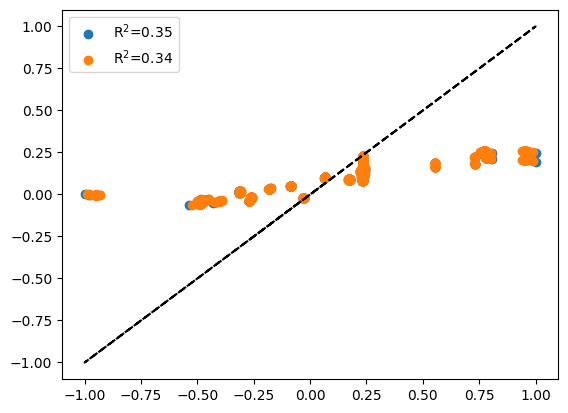

In [12]:
plt.scatter(y_train.flatten(),y_train_pred.flatten(),label="R$^{2}$="+f"{r2_score(y_train.flatten(),y_train_pred.flatten()):.2f}")
plt.plot(y_train.flatten(),y_train.flatten(),'k--')
plt.scatter(y_test.flatten(),y_test_pred.flatten(),label="R$^{2}$="+f"{r2_score(y_test.flatten(),y_test_pred.flatten()):.2f}")
plt.legend()
plt.show()

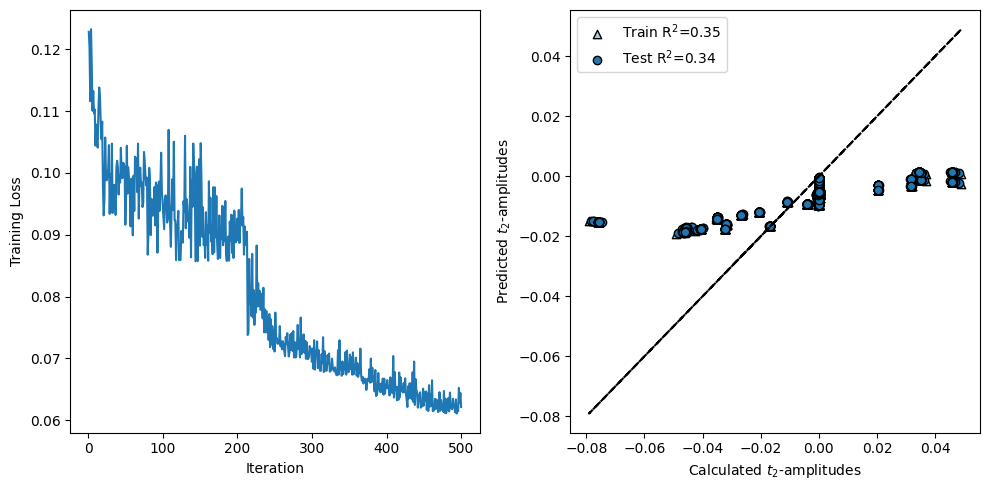

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
cmap = sns.color_palette("Paired",2)
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,5))

sns.lineplot(data=pd.read_csv('model_log.csv',index_col=0).dropna(),x='Iteration',y='Cost',ax=ax1,color=cmap[1])
ax1.set_ylabel("Training Loss")
plt.scatter(unscaled_y_train.flatten(),unscaled_y_train_pred.flatten(),label="Train R$^{2}$="+f"{r2_score(unscaled_y_train.flatten(),unscaled_y_train_pred.flatten()):.2f}",color=cmap[0],marker='^',edgecolors='k')
ax2.plot(unscaled_y_train.flatten(),unscaled_y_train.flatten(),'k--')
ax2.scatter(unscaled_y_test.flatten(),unscaled_y_test_pred.flatten(),label="Test R$^{2}$="+f"{r2_score(unscaled_y_test.flatten(),unscaled_y_test_pred.flatten()):.2f}",color=cmap[1],marker='o',edgecolors='k')
ax2.set_xlabel('Calculated $t_2$-amplitudes')
ax2.set_ylabel('Predicted $t_2$-amplitudes')
ax2.legend()
plt.tight_layout()
# plt.savefig(os.path.join(os.path.expanduser('~'),"qregress/images/DDCC/qiskit_statevector_0.1.png"),dpi=300,bbox_inches='tight')
plt.savefig("3W_qiskit_statevector_0.1.png",dpi=300,bbox_inches='tight')
plt.show()